In [ ]:
from __future__ import print_function
from pathlib import Path
import argparse
import os
import gdal
import cv2
import fnmatch
import tifffile as tiff
import math
from skimage.io import imshow
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

ngpu = 1
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

Random Seed:  999


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
dataroot = "drive/MyDrive/VKR/dataset/png_images_class/image_list/"

image_list = os.listdir(dataroot)

In [ ]:
# Root directory for dataset
dataroot = "drive/MyDrive/VKR/dataset/png_images_class/"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 150

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

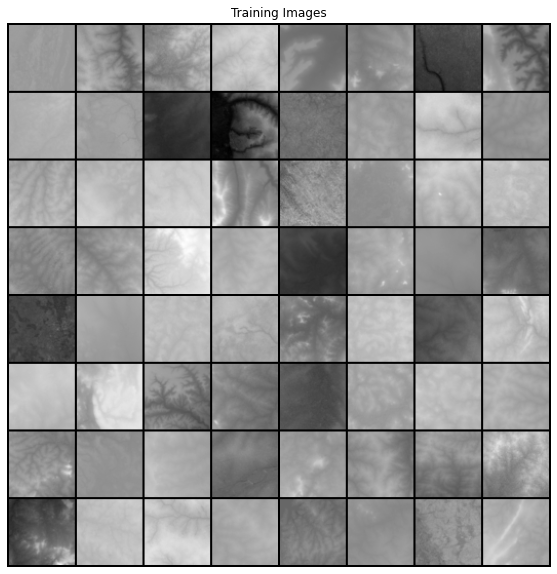

In [ ]:
dataset_clear = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

rotate_dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.RandomRotation((90, 90)),
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

dataloader = torch.utils.data.DataLoader(dataset_clear + rotate_dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(10,10))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [ ]:
dataloader.dataset.datasets

[Dataset ImageFolder
     Number of datapoints: 9315
     Root location: drive/MyDrive/VKR/dataset/png_images_class/
     StandardTransform
 Transform: Compose(
                Resize(size=64, interpolation=bilinear, max_size=None, antialias=None)
                CenterCrop(size=(64, 64))
                ToTensor()
                Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
            ), Dataset ImageFolder
     Number of datapoints: 9315
     Root location: drive/MyDrive/VKR/dataset/png_images_class/
     StandardTransform
 Transform: Compose(
                RandomRotation(degrees=[90.0, 90.0], interpolation=nearest, expand=False, fill=0)
                Resize(size=64, interpolation=bilinear, max_size=None, antialias=None)
                CenterCrop(size=(64, 64))
                ToTensor()
                Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
            )]

In [ ]:
rotate_dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.RandomRotation((90, 90)),
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

dataset = 

# Create the dataloader
dataloader = torch.utils.data.DataLoader(rotate_dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(20,20))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

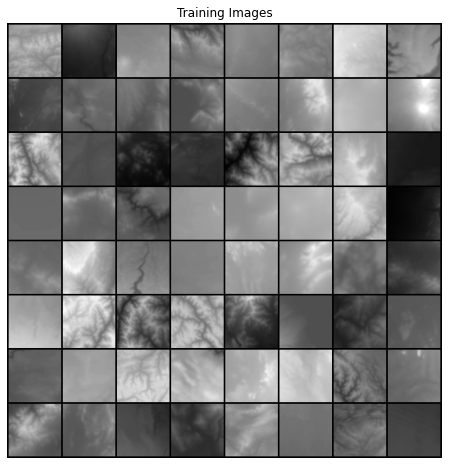

In [ ]:
aug_dataset2 = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.RandomHorizontalFlip(),
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

# Create the dataloader
dataloader = torch.utils.data.DataLoader(aug_dataset2, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [ ]:
aug_new_data = aug_dataset2 + aug_dataset1

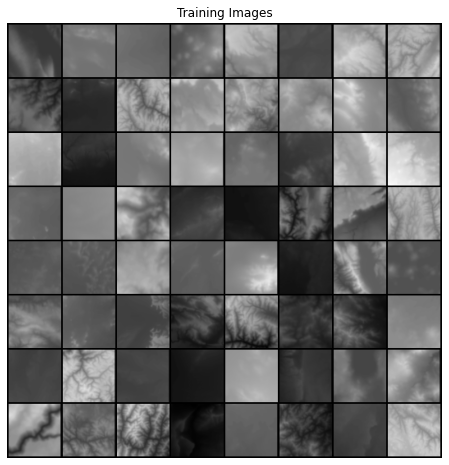

In [ ]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset + aug_new_data, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [ ]:
a[0][0].shape

torch.Size([3, 64, 64])

In [ ]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [ ]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.02.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [ ]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        
        return self.main(input)

In [ ]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [ ]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
# fixed_noise = torch.randn(64, nz, 1, 1, device=device) # batch_size = 128
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [ ]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fixed_noise = torch.randn(64, nz, 1, 1, device=device)
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/150][0/146]	Loss_D: 1.5539	Loss_G: 5.8997	D(x): 0.5710	D(G(z)): 0.5501 / 0.0045
[0/150][50/146]	Loss_D: 0.0012	Loss_G: 35.4925	D(x): 0.9988	D(G(z)): 0.0000 / 0.0000
[0/150][100/146]	Loss_D: 0.0007	Loss_G: 36.1220	D(x): 0.9993	D(G(z)): 0.0000 / 0.0000
[1/150][0/146]	Loss_D: 0.2073	Loss_G: 5.8602	D(x): 0.8740	D(G(z)): 0.0131 / 0.0170
[1/150][50/146]	Loss_D: 0.9728	Loss_G: 5.0788	D(x): 0.9280	D(G(z)): 0.5679 / 0.0088
[1/150][100/146]	Loss_D: 1.4419	Loss_G: 1.1349	D(x): 0.5967	D(G(z)): 0.5218 / 0.3481
[2/150][0/146]	Loss_D: 1.3494	Loss_G: 2.4630	D(x): 0.6203	D(G(z)): 0.5331 / 0.1058
[2/150][50/146]	Loss_D: 0.9101	Loss_G: 2.6654	D(x): 0.7177	D(G(z)): 0.3655 / 0.1049
[2/150][100/146]	Loss_D: 0.5477	Loss_G: 2.2924	D(x): 0.7343	D(G(z)): 0.1994 / 0.1070
[3/150][0/146]	Loss_D: 1.1695	Loss_G: 2.3472	D(x): 0.4710	D(G(z)): 0.0544 / 0.1062
[3/150][50/146]	Loss_D: 0.9940	Loss_G: 2.2544	D(x): 0.6647	D(G(z)): 0.4214 / 0.1256
[3/150][100/146]	Loss_D: 1.3393	Loss_G: 0.9693	D(

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

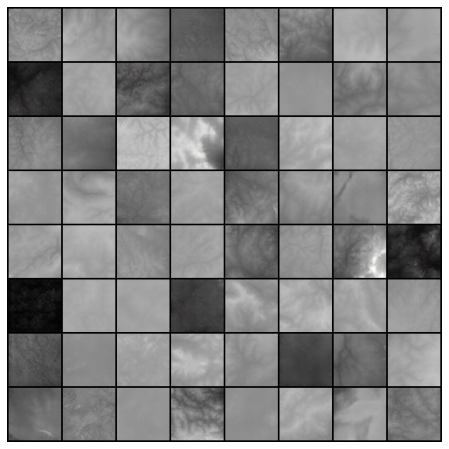

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [ ]:
torch.save(netG.state_dict(), "drive/MyDrive/VKR/DCGAN/DCGAN_netG.pth")
torch.save(netG, "drive/MyDrive/VKR/DCGAN/DCGAN_netG.pt")
torch.save(netD.state_dict(), "drive/MyDrive/VKR/DC GAN/DCGAN_netD.pth")
torch.save(netD, "drive/MyDrive/VKR/DCGAN/DCGAN_netD.pt")

In [ ]:
model_netG = torch.load("drive/MyDrive/VKR/DCGAN/DCGAN_netG.pt", map_location=torch.device('cpu'))
# model_netG.load_state_dict(torch.load('drive/MyDrive/VKR/DCGAN/DCGAN_netG.pth'))
model_netG.eval()

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

In [ ]:
fixed_noise_test = torch.rand(1, 100, 1, 1, device=device)
fake_model_netG = model_netG(fixed_noise_test).detach().cpu().numpy()
fake_img = np.transpose(fake_model_netG.reshape(3, 64, 64),(1,2,0))
plt.imshow(fake_img)

Model netG with vutils

In [ ]:
fake_img_list = []
fixed_noise_test = torch.rand(64, 100, 1, 1, device=device)

  # fixed_noise_test = torch.rand(64, 100, 1, 1, device=device)
fake_netG = netG(fixed_noise_test)
fake_img_list.append(vutils.make_grid(fake_netG, padding=2, normalize=True))

fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i.cpu(),(1,2,0)), animated=True)] for i in fake_img_list]

In [ ]:
def get_preprocess_image(TensorImage, ReturnGray):
  fake_img = np.transpose(vutils.make_grid(TensorImage, normalize=True, padding=0).detach().cpu().numpy().reshape(3, 64, 64), (1,2,0))
  fake_img[fake_img < 0.] = 0.
  fake_img = (fake_img * 255).astype(np.uint8)
  if ReturnGray:
    fake_img = cv2.cvtColor(fake_img, cv2.COLOR_RGB2GRAY)
  return fake_img

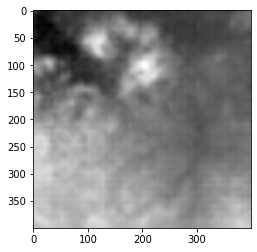

In [ ]:
fixed_noise_test = torch.rand(1, 100, 1, 1, device=device)
generated_image = get_preprocess_image(model_netG(fixed_noise_test), True)
generated_image = cv2.resize(generated_image, [400, 400])
plt.imshow(generated_image, cmap="gray")

In [ ]:
cv2.imwrite('generated_image.png', generated_image)

True

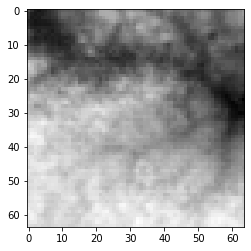

In [ ]:
fixed_noise_test = torch.rand(1, 100, 1, 1, device=device)
sig = nn.Sigmoid()
fake_model_netG = model_netG(fixed_noise_test)
fake_img = np.transpose(vutils.make_grid(fake_model_netG, normalize=True, padding=0).detach().cpu().numpy().reshape(3, 64, 64), (1,2,0))
fake_img[fake_img < 0.] = 0.
fake_img = (fake_img * 255).astype(np.uint8)
fake_img = cv2.cvtColor(fake_img.astype(np.uint8), cv2.COLOR_RGB2GRAY)
#nn.functional.normalize(fake_img)
plt.imshow(fake_img, cmap="gray")

Model netG without vutils

In [ ]:
fake_img_list = []
fixed_noise_test = torch.rand(64, 100, 1, 1, device=device)

  # fixed_noise_test = torch.rand(64, 100, 1, 1, device=device)
fake = netG(fixed_noise_test)
fake_img_list.append(fake.detach().cpu().numpy())
fake_img_list = np.array(fake_img_list)

fake_img_list.reshape(64, 3, 64, 64)

fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i, (1, 2, 0))))] for i in fake_img_list]

Model model_netG with vutils

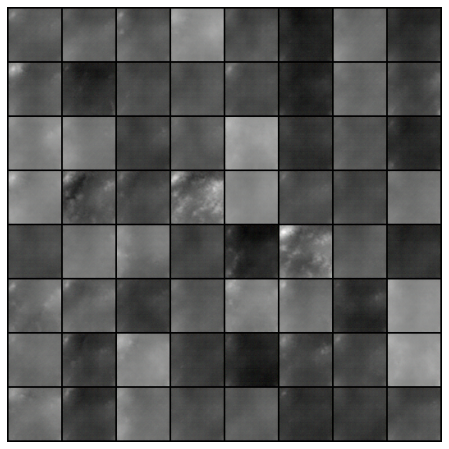

In [ ]:
fake_img_list = []
fixed_noise_test = torch.rand(64, 100, 1, 1, device=device)

  # fixed_noise_test = torch.rand(64, 100, 1, 1, device=device)
fake_model_netG = model_netG(fixed_noise_test)
fake_img_list.append(vutils.make_grid(fake_model_netG, padding=2, normalize=True))

fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i.cpu(),(1,2,0)), animated=True)] for i in fake_img_list]

In [ ]:
import time

def merge_maps(image_map1, image_map2, procent):
  merge_size = round((image_map1.shape[0] * procent), 0)

  image_map1 = image_map1.astype(np.float32)
  image_map2 = image_map2.astype(np.float32)

  coef = 1

  start = int(image_map1.shape[0] - merge_size)
  print(start)
  width = image_map1.shape[0] - start

  for iter in range(start, image_map1.shape[0]):
    coef = 1. - float(iter - start) / width
    image_map1[:, iter] = image_map1[:, iter] * coef
    #plt.imshow(image_map1.astype(np.uint8), cmap="gray")
    #plt.imshow(image_map1, cmap="gray")
    image_map2[:, iter - start] = image_map2[:, iter - start] * (1 - coef)

    # if iter - start == 1:
    #   break

  return image_map1, image_map2, width

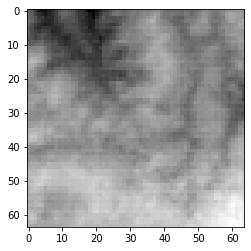

In [ ]:
img1 = cv2.cvtColor(cv2.imread("generated_image.png"), cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(cv2.imread("generated_image (1).png"), cv2.COLOR_BGR2GRAY)

plt.imshow(img1, cmap="gray")

In [ ]:
img1 = cv2.imread("generated_image.png")
img2 = cv2.imread("generated_image (1).png")

image_map1, image_map2, width = merge_maps(img1, img2, 0.4)

38


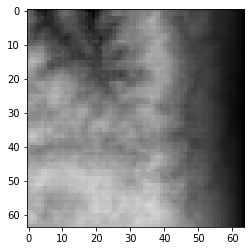

In [ ]:
image_map1 = (image_map1).astype(np.uint8)
plt.imshow(image_map1, cmap="gray")

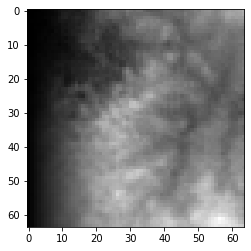

In [ ]:
image_map2 = (image_map2).astype(np.uint8)
plt.imshow(image_map2, cmap="gray")

In [ ]:
result = np.zeros((int(image_map1.shape[1]), int(image_map1.shape[0] + image_map2.shape[0] - width), 3))

In [ ]:
result.shape[1]

109

In [ ]:
result[:, 0:image_map1.shape[0]] += image_map1

start = int(image_map1.shape[0] - width)

for iter in range(start, image_map1.shape[0]):
    #plt.imshow(image_map1.astype(np.uint8), cmap="gray")
    #plt.imshow(image_map1, cmap="gray")
    result[:, iter] = (result[:, iter] + image_map2[:, iter - start])
    # image_map2[:, iter - start] = image_map2[:, iter - start]

result[:, image_map1.shape[1]:result.shape[1]] += image_map2[:, width:image_map2.shape[1]]

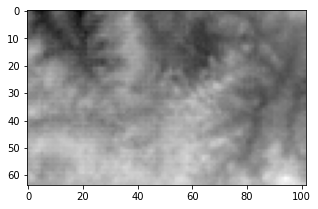

In [ ]:
plt.figure(figsize=(5, 5))
plt.imshow(result.astype(np.uint8), cmap="gray")

In [ ]:
a = cv2.resize(result, [800, 400], interpolation = cv2.INTER_CUBIC)

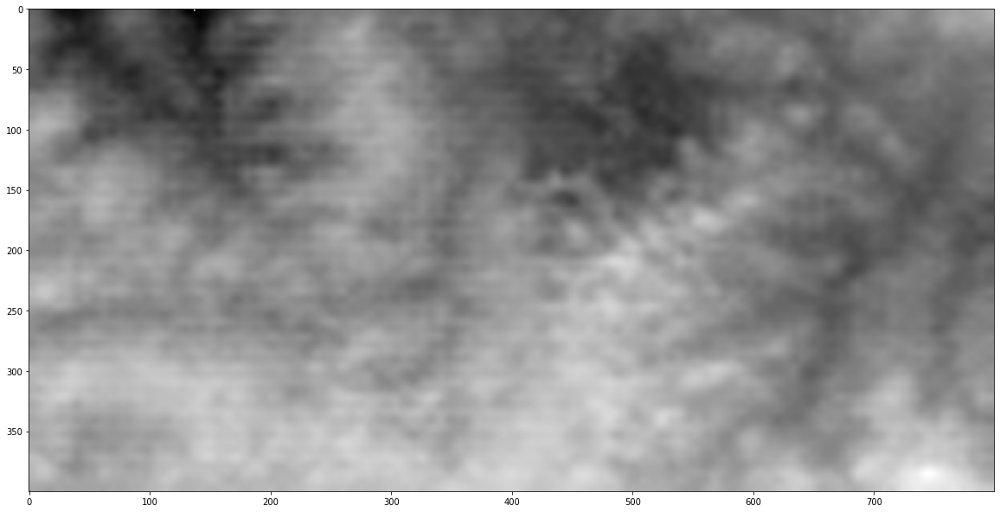

In [ ]:
plt.figure(figsize=(20, 20))
plt.imshow(a.astype(np.uint8), cmap="gray")